In [2]:
from cartoGRAPHs import *
import random 
from sklearn.decomposition import PCA
from sklearn import preprocessing
import json
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt 
import colorsys
from PIL import ImageColor
import pickle as pk

_____
# G G N / gene-gene network 
_____

In [3]:
G = nx.read_weighted_edgelist("output/backbone_gene_graph_significant_weighted.edgelist")
print('G nodes: ',len(G.nodes())) 
print('G edges: ',len(G.edges()))

with open('output/Communities/Infomap/gg_third_iteration_infomap.pickle', 'rb') as handle:
    first_level_infomap = pickle.load(handle)

with open('output/Communities/Infomap/gg_second_iteration_infomap.pickle', 'rb') as handle:
    second_level_infomap = pickle.load(handle)

with open('output/Communities/Infomap/gg_first_iteration_infomap.pickle', 'rb') as handle:
    third_level_infomap = pickle.load(handle)

with open('output/Communities/Infomap/gg_ji_first_infomap_iteration.pickle', 'rb') as handle:
    gg_first_level_infomap = pickle.load(handle)

with open('output/Communities/Infomap/gg_ji_second_infomap_iteration.pickle', 'rb') as handle:
    gg_second_level_infomap = pickle.load(handle)

G nodes:  22338
G edges:  762862


### calculate features based on communities 
+ #1 THIRD LEVEL COMMUNITIES 

In [4]:
gene_list=[]
for gene_l in third_level_infomap.values():
    for e in gene_l:
        gene_list.append(e)
print(len(gene_list))

22338


In [5]:
layout_method = 'third-level-infomap' 

d_comm_third = {}
for g in G.nodes():
    for k,v in third_level_infomap.items():
        if g in v:
            d_comm_third[g] = k

d_communities_third = {}
for g in G.nodes():
    intermed_list = [0]*len(third_level_infomap.keys())
    for k,v in third_level_infomap.items():
        if g in v:
            intermed_list[k-1] = 1
    d_communities_third[g] = intermed_list
d_nodefeatures_third = d_comm_third

FM_communities_third = pd.DataFrame(d_communities_third).T

print(len(third_level_infomap))
FM_communities_third

64


,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
AR,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MYC,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABCB1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR1284,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR1301,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR371B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


+ #2 SECOND LEVEL COMMUNITITES

In [6]:
layout_method = 'second-level-infomap' 

d_comm_second = {}
for g in G.nodes():
    for k,v in second_level_infomap.items():
        if g in v:
            d_comm_second[g] = k

d_communities_second = {}
for g in G.nodes():
    intermed_list = [0]*len(second_level_infomap.keys())
    for k,v in second_level_infomap.items():
        if g in v:
            intermed_list[k-1] = 1
    d_communities_second[g] = intermed_list
d_nodefeatures_second = d_comm_second

FM_communities_second = pd.DataFrame(d_communities_second).T

print(len(second_level_infomap))
FM_communities_second

429


,0,1,2,3,4,5,6,7,8,9,...,419,420,421,422,423,424,425,426,427,428
AR,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MYC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABCB1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR1284,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR1301,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR371B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


+ #3 FIRST LEVEL COMMUNITIES

In [7]:
layout_method = 'first-level-infomap' 

d_comm_first = {}
for g in G.nodes():
    for k,v in first_level_infomap.items():
        if g in v:
            d_comm_first[g] = k

d_communities_first = {}
for g in G.nodes():
    intermed_list = [0]*len(first_level_infomap.keys())
    for k,v in first_level_infomap.items():
        if g in v:
            intermed_list[k-1] = 1
    d_communities_first[g] = intermed_list
d_nodefeatures_first = d_comm_first

FM_communities_first = pd.DataFrame(d_communities_first).T

print(len(first_level_infomap))
FM_communities_first

461


,0,1,2,3,4,5,6,7,8,9,...,451,452,453,454,455,456,457,458,459,460
AR,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MYC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABCB1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR1284,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR1301,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR371B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
r = 0.9
alpha = 1.0

A = nx.adjacency_matrix(G, nodelist=list(G.nodes()))
DM_m = rnd_walk_matrix2(A, r, alpha, len(G.nodes()))
FM_structural = pd.DataFrame(DM_m)
FM_structural.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural.index=list(G.nodes())
FM_structural.columns=list(G.nodes())
FM_structural

,AR,MYC,ABCB1,CASP3,CASP8,AKT1,HIF1A,MAPK1,MAPK3,MAPK8,...,MIR302F,MIR937,MIR553,MIR890,MIR1184-1,MIR1284,MIR1301,MIR658,MIR371B,MIR4468
AR,0.900101,0.000557,0.001048,0.000846,0.000583,0.000662,0.000466,0.000778,0.000773,0.000502,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MYC,0.001567,0.900077,0.001174,0.001254,0.001048,0.001172,0.000900,0.001176,0.001178,0.000799,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ABCB1,0.001366,0.000544,0.900084,0.001013,0.000768,0.000819,0.000564,0.000835,0.000827,0.000555,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CASP3,0.001180,0.000621,0.001084,0.900108,0.001785,0.001435,0.000597,0.001690,0.001668,0.000712,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CASP8,0.001157,0.000740,0.001170,0.002544,0.900089,0.001294,0.000732,0.001228,0.001226,0.000879,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR1284,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.090909,0.909091,0.000000,0.000000,0.000000,0.000000
MIR1301,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.909091,0.090909,0.000000,0.000000
MIR658,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.090909,0.909091,0.000000,0.000000
MIR371B,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.909091,0.090909


___ 
# 1 VIS 1 - Visualizing 1 selected community of each level
___

## Complete GGN network - Vis

In [9]:
## ########################################
# select which level :
########################################

layoutname = 'thirdlevel'
x_level_infomap = third_level_infomap
d_comm = d_comm_third
FM_communities = FM_communities_third

# set visualization parameters (i.e. colors for communities, node size, features.. )
colorlist_verybright = ['#FF355E','#FF6037','#FF9933',
               '#FFCC33', '#FFFF66', '#CCFF00','#A7F432',
                '#AAF0D1', '#50BFE6', '#FF6EFF',
                '#FF00CC', 
]

colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

colorlist_fin = colorlist_paper * (len(x_level_infomap.keys())//len(colorlist_paper)) +colorlist_paper

# #try to get unique colors for each community instead of hardcoded colors 
# colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(x_level_infomap.keys()))
# colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
# random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign random color to each community
d_comm_col = dict(zip(x_level_infomap.keys(), colorlist_fin))
print(len(d_comm_col))

# match community colors assigned to nodes-community assignment
d_nodecolors_hex = {} 
for node,comm in d_comm.items():
    for com,col in d_comm_col.items():
        if comm == com:
            d_nodecolors_hex[node] = col 

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25

edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'

# get all subgraphs of all communities : 
nodes_allcommunities = []
subgraphs_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):

    nodes_comm0 = []
    for node, comm in d_comm.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_allcommunities.append(nodes_comm0)
    subgraphs_allcommunities.append(G_comm0)

number of unique colors: 16
64


### FEATURE MODULATED LAYOUT 
structural (global) with functional (communities)

In [10]:
scalar_val = 0.35
layout_method = 'modulated-scal'+str(scalar_val)
DF_structural = FM_structural
DF_functional = FM_communities.T
DF_merge = feature_modulation(DF_structural,DF_functional, scalar_val)

n_n = 12
spr = 1.0
md = 0.9
metr2D = 'cosine'

posG2D_modulated = layout_portrait_umap(G,
                                   DF_structural,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

posG2D_new = posG2D_modulated

/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
python(2544) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


In [11]:
posG3D_modulated = layout_portrait_umap(G,
                                   DF_structural,
                                   3,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

posG3D_new = posG3D_modulated

/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [12]:
exposurome_3dpos=[]
exposurome_col=[]
exposurome_col_dict={}
for exp,pos in posG3D_new.items():
    exposurome_3dpos.append(pos)
    for i,n_comm in enumerate(nodes_allcommunities):
        if exp in n_comm:
            exposurome_col.append(d_comm_col[i+1])
            exposurome_col_dict[exp]=d_comm_col[i+1]


In [12]:

with open('output/gg_ji_exposurome_col_dict_infomap.pickle', 'wb') as handle:
    pickle.dump(exposurome_col_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [13]:

np.savetxt("output/VR/gg_Exposuromepos3d_infomap.csv", 
           exposurome_3dpos,
           delimiter =",", 
           fmt ='% s')

In [14]:
exposurome_col_rgb=[]
for hexcol in exposurome_col:
    rgb=list(ImageColor.getcolor(hexcol, "RGB"))
    rgb.append(100)
    exposurome_col_rgb.append(rgb)

In [15]:
np.savetxt("output/VR/gg_Exposuromecol_infomap.csv", 
           exposurome_col_rgb,
           delimiter =",", 
           fmt ='% s')

In [13]:
#I need to relabel the nodes to indexes
exposurome_map={}
exp_id_list=[]
c=0
for exp_node in posG3D_new.keys():
    exposurome_map[exp_node]=c
    exp_id_list.append(exp_node)
    c=c+1

In [14]:
#Let's change the names of these communities based on their size

#BROADEST==third
third_level_infomap_sort=dict(sorted(third_level_infomap.items(), key=lambda item: len(item[1]), reverse = True))
third_renamed_third_conversion_dict={}
renamed_third_level_infomap_sort={}
c=1
for com,explist in third_level_infomap_sort.items():
    renamed_third_level_infomap_sort[str(c)]=explist
    third_renamed_third_conversion_dict[com]=str(c)
    c=c+1
    
#MIDDLE==second

second_renamed_second_conversion_dict={}
renamed_second_level_infomap_sort={}

for br_com,mid_com in gg_second_level_infomap.items():
    if len(mid_com)==1:
        newcom=third_renamed_third_conversion_dict[br_com]
        renamed_second_level_infomap_sort[newcom]=second_level_infomap[mid_com[0]]
        second_renamed_second_conversion_dict[mid_com[0]]=newcom
    else:
        sorted_list=list(sorted(mid_com, key=lambda item: len(second_level_infomap[item]), reverse = True))
        for i in range(len(sorted_list)):
            q=i+1
            newcom=third_renamed_third_conversion_dict[br_com]+"_"+str(q)
            renamed_second_level_infomap_sort[newcom]=second_level_infomap[sorted_list[i]]
            second_renamed_second_conversion_dict[sorted_list[i]]=newcom
        
#FINEST==first  

first_renamed_first_conversion_dict={}
renamed_first_level_infomap_sort={}

for mid_com,fin_com in gg_first_level_infomap.items():
    if len(fin_com)==1:
        newcom=second_renamed_second_conversion_dict[mid_com]
        renamed_first_level_infomap_sort[newcom]=first_level_infomap[fin_com[0]]
        first_renamed_first_conversion_dict[fin_com[0]]=newcom
    else:
        sorted_list=list(sorted(fin_com, key=lambda item: len(first_level_infomap[item]), reverse = True))
        for i in range(len(sorted_list)):
            q=i+1
            newcom=second_renamed_second_conversion_dict[mid_com]+"_"+str(q)
            renamed_first_level_infomap_sort[newcom]=first_level_infomap[sorted_list[i]]
            first_renamed_first_conversion_dict[sorted_list[i]]=newcom
        

In [15]:
third_renamed_third_conversion_dict_rev={}
for k,v in third_renamed_third_conversion_dict.items():
    third_renamed_third_conversion_dict_rev[v]=k

second_renamed_second_conversion_dict_rev={}
for k,v in second_renamed_second_conversion_dict.items():
    second_renamed_second_conversion_dict_rev[v]=k

first_renamed_first_conversion_dict_rev={}
for k,v in first_renamed_first_conversion_dict.items():
    first_renamed_first_conversion_dict_rev[v]=k

In [16]:
tot_v=[]
for k,v in renamed_second_level_infomap_sort.items():
    tot_v.extend(v)
len(tot_v)

22338

In [17]:
tremap_color_dict={}
for com,explist in renamed_third_level_infomap_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(exposurome_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)

for com,explist in renamed_second_level_infomap_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(exposurome_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)
        
for com,explist in renamed_first_level_infomap_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(exposurome_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)
len(tremap_color_dict)

468

In [18]:

color_list=[]
com_list=[]
value_list=[]
parent_list=[]

for com, color in tremap_color_dict.items():
    com_list.append(com)
    color_list.append(color)
    
    comgrouplist=com.split("_")
    if len(comgrouplist)==1:
        value_list.append(len(renamed_third_level_infomap_sort[com]))
        parent_list.append("")
    
    elif len(comgrouplist)==2:
        try:
            value_list.append(len(renamed_second_level_infomap_sort[com]))
            oldcom=second_renamed_second_conversion_dict_rev[com]
            for brcom,midcomlist in gg_second_level_infomap.items():
                if oldcom in midcomlist:
                    parent_list.append(third_renamed_third_conversion_dict[brcom])
        except:
            value_list.append(len(renamed_first_level_infomap_sort[com]))
            oldcom=first_renamed_first_conversion_dict_rev[com]
            for midcom,fincomlist in gg_first_level_infomap.items():
                if oldcom in fincomlist:
                    parent_list.append(second_renamed_second_conversion_dict[midcom])
            
        
    else:
        value_list.append(len(renamed_first_level_infomap_sort[com]))
        oldcom=first_renamed_first_conversion_dict_rev[com]
        for midcom,fincomlist in gg_first_level_infomap.items():
            if oldcom in fincomlist:
                parent_list.append(second_renamed_second_conversion_dict[midcom])
        

python(67150) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


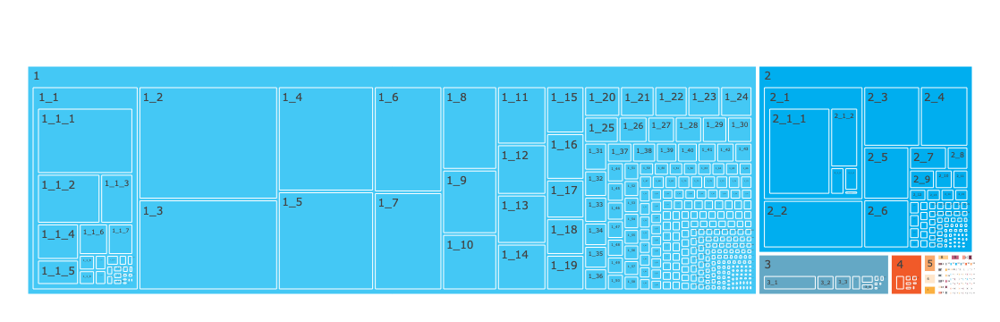

In [22]:
import plotly.graph_objects as go


fig = go.Figure(go.Treemap(
    branchvalues = "total",
    labels = com_list,
    values = value_list,
    parents = parent_list,
    marker_colors = color_list
))

fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.write_image('output/Figures/SF19B_v01_post_rev.pdf')
fig.show()

In [19]:
# --- build source data table ---
source_df = pd.DataFrame({
    "label": com_list,
    "parent": parent_list,
    "value": value_list,
    "color": color_list
})


# optional metadata (recommended)
source_df["figure"] = "SF25B"
source_df["description"] = "Treemap of the GGN"

# --- write to excel ---
with pd.ExcelWriter("output/Source_Data_exposurome.xlsx", engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    source_df.to_excel(writer, sheet_name="SF25B", index=False)
print("Source data for treemap exported.")

Source data for treemap exported.


In [20]:
#We are using the new nomenclature
fine_grained_communities_list=[]
middle_communities_list=[]
broad_communities_list=[]

for com,explist in renamed_first_level_infomap_sort.items():
    comlist=com.split("_")
    if len(comlist)==1:
        fine_grained_communities_list.append(com)
    elif len(comlist)==2:
        fine_grained_communities_list.append(com)
        middle_communities_list.append(comlist[0])
    else:
        fine_grained_communities_list.append(com)
        middle_communities_list.append(comlist[0]+"_"+comlist[1])
        broad_communities_list.append(comlist[0])

fine_grained_communities_set=set(fine_grained_communities_list)
middle_communities_set=set(middle_communities_list)
broad_communities_set=set(broad_communities_list)
print(len(broad_communities_set))  
print(len(middle_communities_set))  
print(len(fine_grained_communities_set))  

2
7
461


In [24]:
fine_grained_communities_dict={}
middle_communities_dict={}
broad_communities_dict={}

for com in fine_grained_communities_set:
    fine_grained_communities_dict[com]=renamed_first_level_infomap_sort[com]
    
for com in middle_communities_set:
    try:
        middle_communities_dict[com]=renamed_second_level_infomap_sort[com]
    except:
        middle_communities_dict[com]=renamed_third_level_infomap_sort[com]

for com in broad_communities_set:
    broad_communities_dict[com]=renamed_third_level_infomap_sort[com]
    
with open('output/Communities/Infomap/gg_ji_infomap_fine_grained_communities_dict.pickle', 'wb') as handle:
    pk.dump(fine_grained_communities_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

with open('output/Communities/Infomap/gg_ji_infomap_middle_communities_dict.pickle', 'wb') as handle:
    pk.dump(middle_communities_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

with open('output/Communities/Infomap/gg_ji_infomap_broad_communities_dict.pickle', 'wb') as handle:
    pk.dump(broad_communities_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

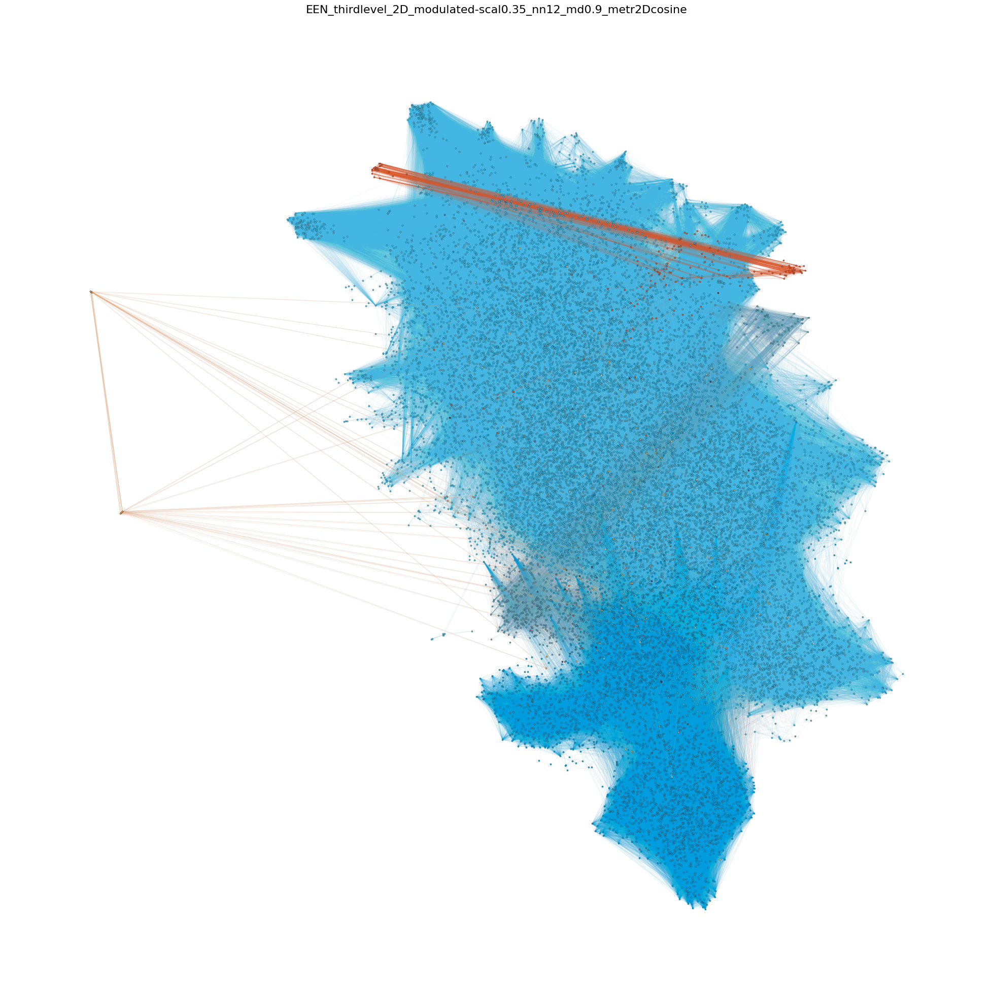

In [21]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values())-1,max(d_comm.values())):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm-1 == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G,posG2D_new, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = colors_allcommunities[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 0.5, edge_color = colors_allcommunities[i], alpha = 0.075)

plt.box(False)
#plt.savefig('output/Figures/SF19A_part1_v01_post_rev.pdf',dpi=300)
#plt.savefig('output/Figures/SF19A_part1_v01_post_rev.png',dpi=300)

plt.show()

In [22]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_new.items():

    community_id = d_comm.get(node)
    node_color = d_comm_col.get(community_id)

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 5,
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None
    })


# ----------------------------
# EDGES (ALL EDGES)
# ----------------------------
for u, v in G.edges():

    comm_u = d_comm.get(u)
    comm_v = d_comm.get(v)

    # determine edge style exactly like plot
    if comm_u == comm_v:
        edge_color = d_comm_col.get(comm_u)
        edge_width = 1
    else:
        edge_color = "#a9a9a9"
        edge_width = 0.05

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width
    })


df_network = pd.DataFrame(rows)


# ----------------------------
# SAVE SAFELY (append, no overwrite)
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(
    out_file,
    engine="openpyxl",
    mode="a",
    if_sheet_exists="replace"   
) as writer:

    df_network.to_excel(
        writer,
        sheet_name="SF25A_part1",
        index=False
    )

print("Network source data saved safely.")

Network source data saved safely.


In [39]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

In [26]:
for com, genelist in fine_grained_communities_dict.items():
    if 'AKAP3' in genelist:
        print(com)
    

1_107


In [27]:
fine_grained_communities_dict['1_107']

['AKAP3',
 'CXADRP3',
 'FBXO47',
 'KRTAP19-7',
 'LINC00159',
 'LINC02325',
 'MYO1H',
 'RSU1P2',
 'TTTY18',
 'GADL1',
 'APOBEC4',
 'NME9']

In [28]:
for com, genelist in fine_grained_communities_dict.items():
    if 'OR3A2' in genelist:
        print(com)
    

1_82


In [29]:
fine_grained_communities_dict['1_82']

['OR51I1',
 'OR7C2',
 'OR1E2',
 'OR1J2',
 'OR2M4',
 'OR3A2',
 'OR4D2',
 'OR51M1',
 'OR6B1',
 'OR6W1P',
 'OR7C1',
 'TAS2R13',
 'TAS2R39',
 'TAS2R7',
 'LAMB4',
 'LINC01591']

# Specific Communities per Level - Vis

### THIRD LEVEL

Number of exposures in community: 0
Specific Graph: Graph with 17246 nodes and 565932 edges


/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of Nodes: (to match G_sub_third nodes):  17246
communities of second level in third level community selected:  {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198,

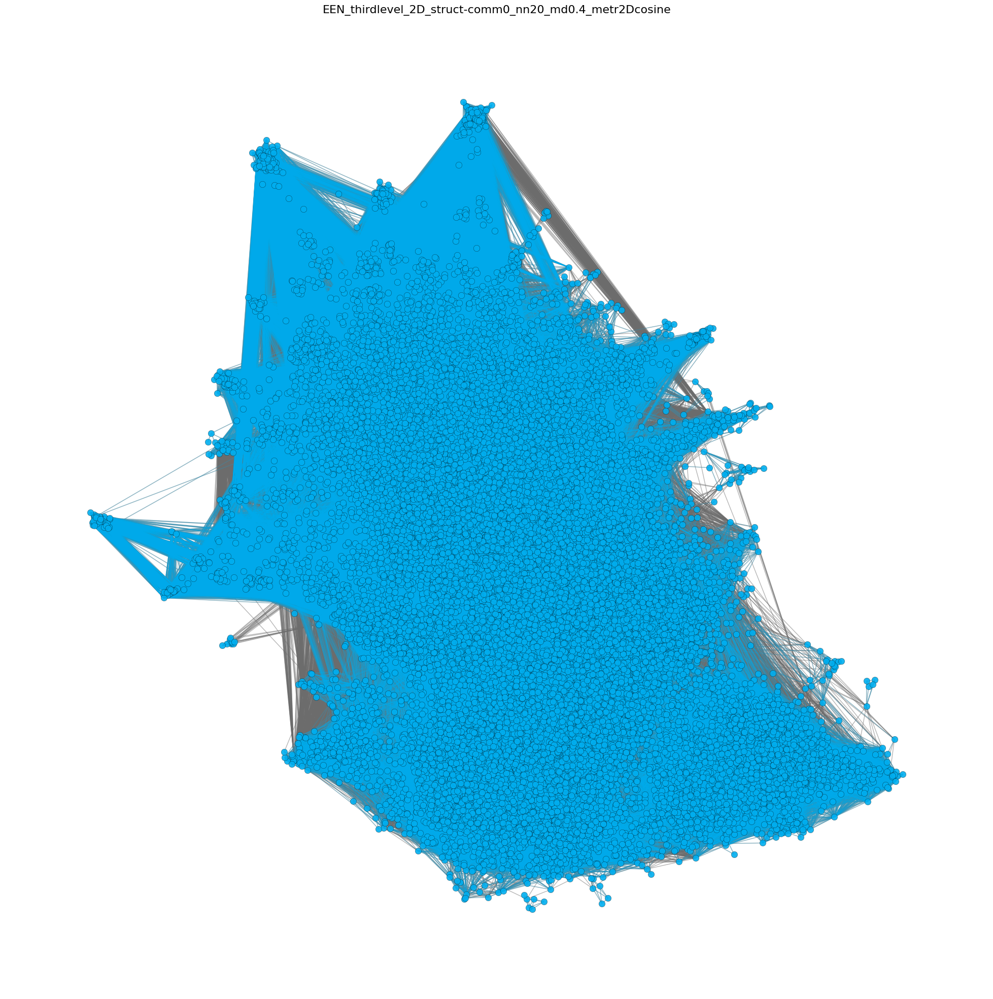

In [23]:
layoutname = 'thirdlevel'

##########################################################
spec_comm_third = 0 #Salvo's selection 1
##########################################################

sublist_third = []
for k,v in d_comm_third.items():
    if v == spec_comm_third:
        sublist_third.append(k)

d_selectedcommunity_thirdlevel = {spec_comm_third:sublist_third}
print("Number of exposures in community:" , len(*d_selectedcommunity_thirdlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_third.values()),max(d_comm_third.values())):
    nodes_comm0 = []
    for node, comm in d_comm_third.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_subcommunities.append(nodes_comm0)
    subgraphs_subcommunities.append(G_comm0)
    
G_sub_third = subgraphs_subcommunities[spec_comm_third]
print("Specific Graph:" , G_sub_third)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_third) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_third, nodelist=list(G_sub_third.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_third.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_third.nodes())
FM_structural_sub.columns=list(G_sub_third.nodes())

n_n = 20
spr = 0.6
md = 0.4
metr2D = 'cosine'
posG2D_third = layout_portrait_umap(G_sub_third,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_third nodes): ', len(posG2D_third))



########################################
# COLORS 
########################################

# get all nodes of 3rd level subgraph - and their second level assigned communities
d_comm_second_selected = {}
for node in G_sub_third.nodes():
    if node in d_comm_second.keys():    
        d_comm_second_selected[node] = d_comm_second[node]
print("communities of second level in third level community selected: ", set(d_comm_second_selected.values()))

set_communities = set(d_comm_second_selected.values())




colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

colorlist_fin = [colorlist_paper[4],colorlist_paper[1]] # * (len(x_level_louvain.keys())//len(colorlist_paper)) +colorlist_paper
print("colorlist fin:" , colorlist_fin)

#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign random color to each community
d_comm_col = dict(zip(x_level_infomap.keys(), colorlist_fin))
print(len(d_comm_col))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_secondlevel = []
subgraphs_allcommunities_secondlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_second.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_third.subgraph(nodes_comm)

    nodes_allcommunities_secondlevel.append(nodes_comm)
    subgraphs_allcommunities_secondlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_secondlevel))
print("Number of second level communities: ", len(nodes_allcommunities_secondlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_secondlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items():
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_secondlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_secondlevel))

colors_allcommunities_secondlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_secondlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_secondlevel)))


########################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.5)

# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_secondlevel[i],
                            dict(*pos2D_allcommunities_secondlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth, 
                            node_color = colors_allcommunities_secondlevel[1], 
                            node_size = 80, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_secondlevel[i],dict(*pos2D_allcommunities_secondlevel[i]), width = 1.25, edge_color = colors_allcommunities_secondlevel[1], alpha = 0.2)

plt.box(False)

#plt.savefig('output/Figures/SF19A_part2_post_rev.pdf',dpi=300)
#plt.savefig('output/Figures/SF19A_part2_post_rev.png',dpi=300)
plt.show()



In [24]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_third.items():
    # get second-level community and color
    community_id = d_comm_second_selected.get(node)
    node_color = d_comm_col.get(community_id)

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 80,
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None
    })

# ----------------------------
# EDGES (ALL EDGES in the subgraph)
# ----------------------------
for u, v in G_sub_third.edges():
    comm_u = d_comm_second_selected.get(u, -1)
    comm_v = d_comm_second_selected.get(v, -1)

    if comm_u == comm_v and comm_u != -1:
        edge_color = d_comm_col.get(comm_u, "#000000")
        edge_width = 2
        edge_alpha = 0.2
    else:
        edge_color = "#a9a9a9"
        edge_width = 0.1
        edge_alpha = 0.01

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width,
        "edge_alpha": edge_alpha
    })

# ----------------------------
# CREATE DATAFRAME
# ----------------------------
df_subnetwork = pd.DataFrame(rows)

print("Nodes:", len(df_subnetwork[df_subnetwork['row_type']=='node']))
print("Edges:", len(df_subnetwork[df_subnetwork['row_type']=='edge']))

# ----------------------------
# SAVE TO EXCEL
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(out_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_subnetwork.to_excel(writer, sheet_name="SF25A_part2", index=False)

print("Third-level subnetwork saved successfully in Excel!")

Nodes: 17246
Edges: 565932
Third-level subnetwork saved successfully in Excel!


Number of exposures in community: 0
Specific Graph: Graph with 17246 nodes and 565932 edges


/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of Nodes: (to match G_sub_third nodes):  17246
communities of second level in third level community selected:  {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198,

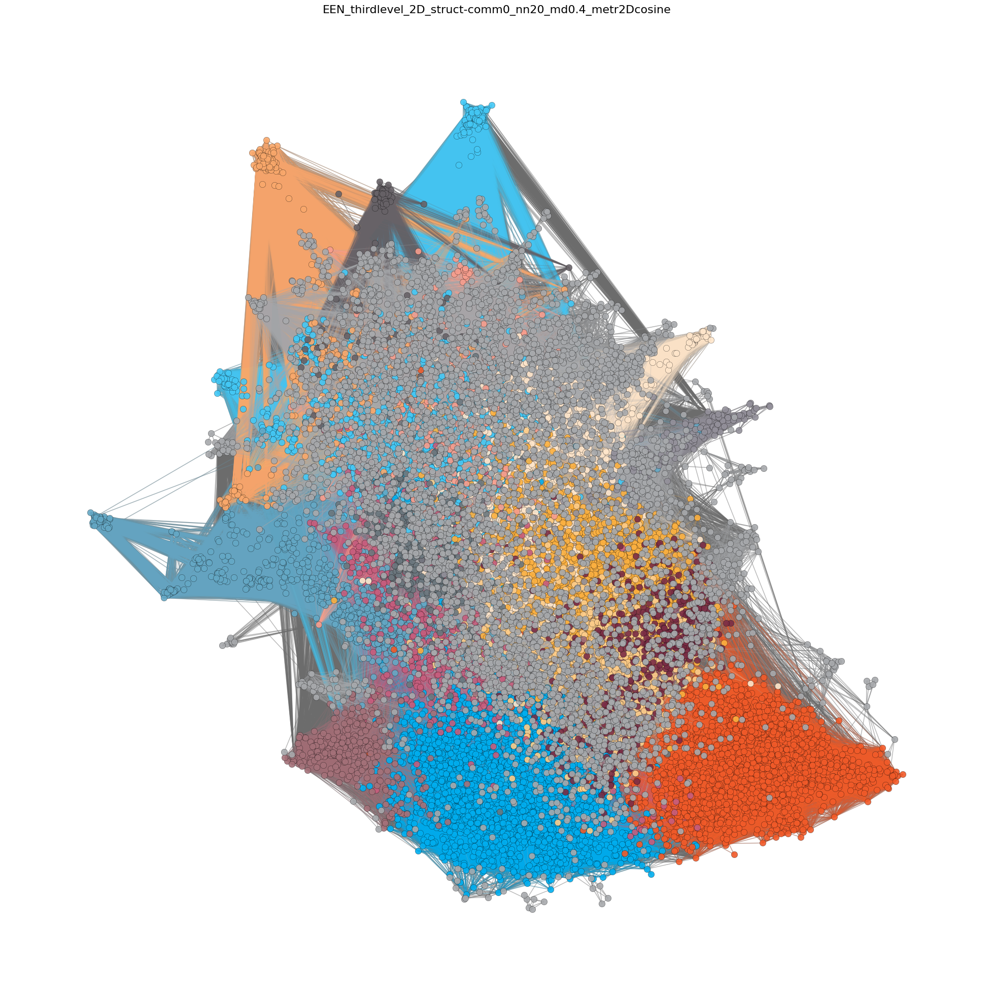

In [25]:
layoutname = 'thirdlevel'

##########################################################
spec_comm_third = 0 #Salvo's selection 1
##########################################################

sublist_third = []
for k,v in d_comm_third.items():
    if v == spec_comm_third:
        sublist_third.append(k)

d_selectedcommunity_thirdlevel = {spec_comm_third:sublist_third}
print("Number of exposures in community:" , len(*d_selectedcommunity_thirdlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_third.values()),max(d_comm_third.values())):
    nodes_comm0 = []
    for node, comm in d_comm_third.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_subcommunities.append(nodes_comm0)
    subgraphs_subcommunities.append(G_comm0)
    
G_sub_third = subgraphs_subcommunities[spec_comm_third]
print("Specific Graph:" , G_sub_third)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_third) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_third, nodelist=list(G_sub_third.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_third.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_third.nodes())
FM_structural_sub.columns=list(G_sub_third.nodes())

n_n = 20
spr = 0.6
md = 0.4
metr2D = 'cosine'
posG2D_third = layout_portrait_umap(G_sub_third,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_third nodes): ', len(posG2D_third))



########################################
# COLORS 
########################################

# get all nodes of 3rd level subgraph - and their second level assigned communities
d_comm_second_selected = {}
for node in G_sub_third.nodes():
    if node in d_comm_second.keys():    
        d_comm_second_selected[node] = d_comm_second[node]
print("communities of second level in third level community selected: ", set(d_comm_second_selected.values()))

set_communities = set(d_comm_second_selected.values())



colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

#colorlist_fin = [colorlist_paper[4],colorlist_paper[1]] # * (len(x_level_louvain.keys())//len(colorlist_paper)) +colorlist_paper
colorlist_fin = colorlist_paper
print("colorlist fin:" , colorlist_fin)

#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign random color to each community
d_comm_col = dict(zip(x_level_infomap.keys(), colorlist_fin))
print(len(d_comm_col))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_secondlevel = []
subgraphs_allcommunities_secondlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_second.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_third.subgraph(nodes_comm)

    nodes_allcommunities_secondlevel.append(nodes_comm)
    subgraphs_allcommunities_secondlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_secondlevel))
print("Number of second level communities: ", len(nodes_allcommunities_secondlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_secondlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items():
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_secondlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_secondlevel))

colors_allcommunities_secondlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_secondlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_secondlevel)))


########################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.5)

# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_secondlevel[i],
                            dict(*pos2D_allcommunities_secondlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth, 
                            node_color = colors_allcommunities_secondlevel[i], 
                            node_size = 80, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_secondlevel[i],dict(*pos2D_allcommunities_secondlevel[i]), width = 1.25, edge_color = colors_allcommunities_secondlevel[i], alpha = 0.2)

plt.box(False)

#plt.savefig('output/Figures/SF19A_part3_post_rev.pdf',dpi=300)
#plt.savefig('output/Figures/SF19A_part3_post_rev.png',dpi=300)
plt.show()


In [28]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_third.items():  # using the same positions as in the plot
    community_id = d_comm_second_selected.get(node)
    node_color = d_comm_col.get(community_id)

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 400,  # same as plotted
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None
    })

# ----------------------------
# EDGES (ALL EDGES in the subgraph)
# ----------------------------
for u, v in G_sub_third.edges():
    comm_u = d_comm_second_selected.get(u, -1)
    comm_v = d_comm_second_selected.get(v, -1)

    # edge style: within community vs across communities
    if comm_u == comm_v and comm_u != -1:
        edge_color = d_comm_col.get(comm_u, "#000000")
        edge_width = 5.0
        edge_alpha = 0.2
    else:
        edge_color = "#6C6C6C"
        edge_width = 5.0
        edge_alpha = 0.1

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width,
        "edge_alpha": edge_alpha
    })

# ----------------------------
# CREATE DATAFRAME
# ----------------------------
df_subnetwork_second = pd.DataFrame(rows)

print("Nodes:", len(df_subnetwork_second[df_subnetwork_second['row_type']=='node']))
print("Edges:", len(df_subnetwork_second[df_subnetwork_second['row_type']=='edge']))

# ----------------------------
# SAVE TO EXCEL
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(out_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_subnetwork_second.to_excel(writer, sheet_name="SF25A_part3", index=False)

print("Second-level subnetwork saved successfully in Excel!")

Nodes: 17246
Edges: 565932
Second-level subnetwork saved successfully in Excel!


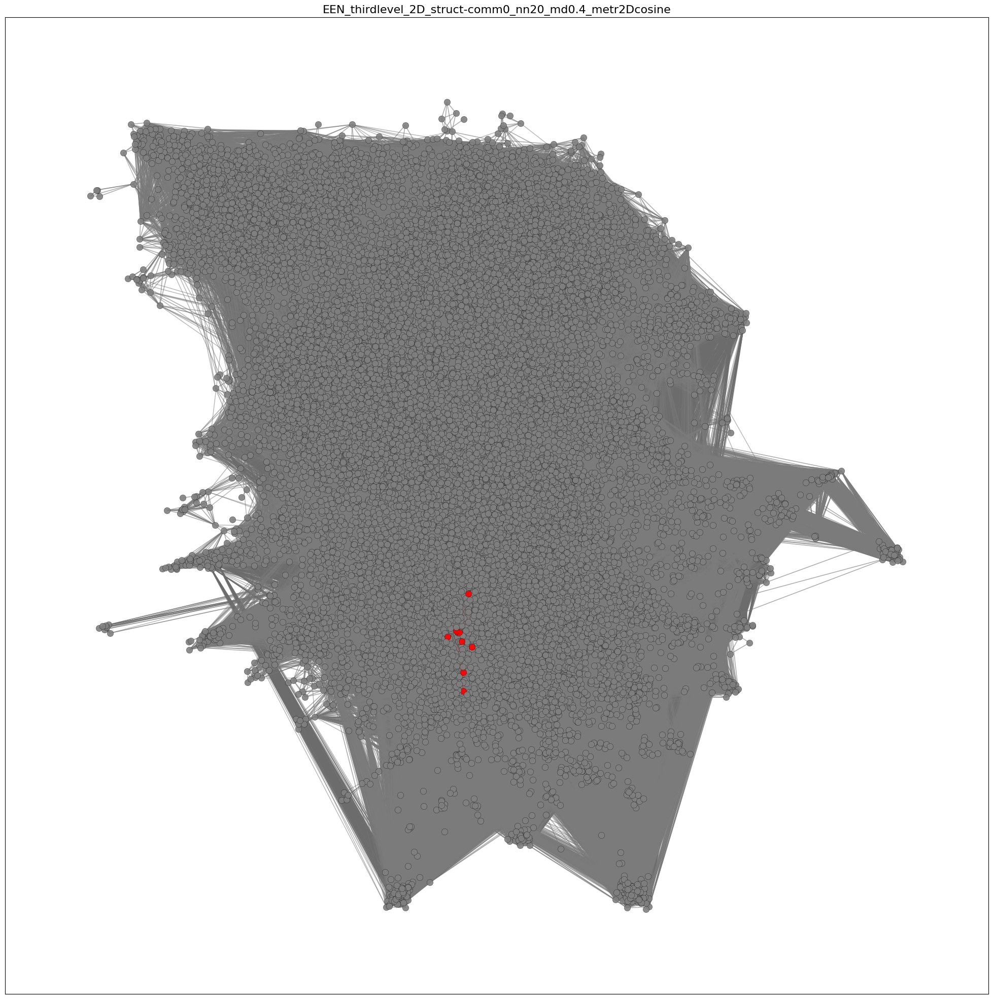

In [53]:
check_colors_allcommunities_firstlevel=[]
for i in range(len(colors_allcommunities_secondlevel)):
    if i==79:   
        check_colors_allcommunities_firstlevel.append("red")
    else:
        check_colors_allcommunities_firstlevel.append("grey")


plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.5)

# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_secondlevel[i],
                            dict(*pos2D_allcommunities_secondlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth, 
                            node_color = check_colors_allcommunities_firstlevel[i], 
                            node_size = 80, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_secondlevel[i],dict(*pos2D_allcommunities_secondlevel[i]), width = 1.25, edge_color = check_colors_allcommunities_firstlevel[i], alpha = 0.2)


plt.show()

### FIRST LEVEL

In [32]:

first_renamed_first_conversion_dict_rev['1_107']

96

Number of exposures in community: 12
Specific Graph: Graph with 12 nodes and 60 edges


/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of Nodes: (to match G_sub_first nodes):  12
communities of second level in third level community selected:  {96}
number of unique colors: 1
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1
Number of individual colors:  1


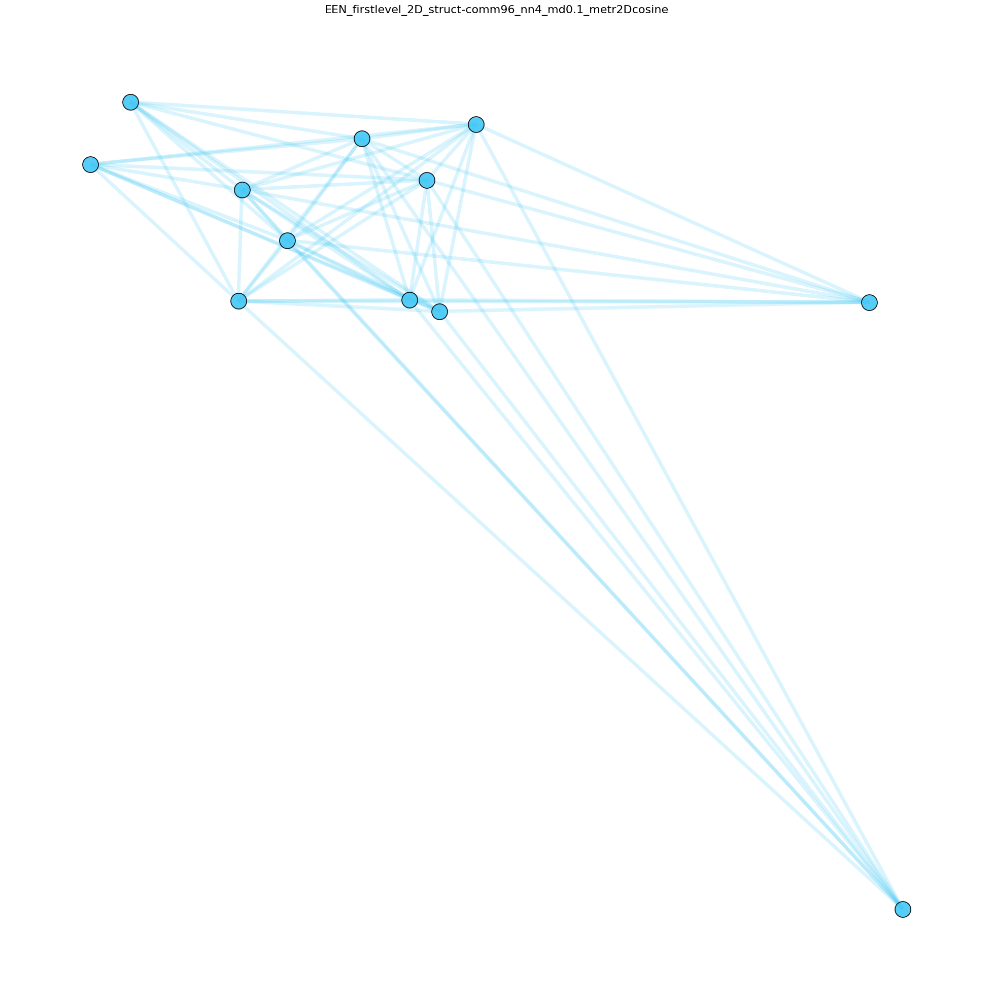

In [29]:
layoutname = 'firstlevel'

##########################################################
spec_comm_first = 96 #Salvo's selection 1_107
##########################################################

sublist_first = []
for k,v in d_comm_first.items():
    if v == spec_comm_first:
        sublist_first.append(k)

d_selectedcommunity_firstlevel = {spec_comm_first:sublist_first}
print("Number of exposures in community:" , len(*d_selectedcommunity_firstlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_first.values()),max(d_comm_first.values())):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community-1:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_first = subgraphs_subcommunities[spec_comm_first]
print("Specific Graph:" , G_sub_first)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_first) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_first, nodelist=list(G_sub_first.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_first.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_first.nodes())
FM_structural_sub.columns=list(G_sub_first.nodes())

n_n = 4
spr = 1.0
md = 0.1
metr2D = 'cosine'
posG2D_first = layout_portrait_umap(G_sub_first,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_first nodes): ', len(posG2D_first))

########################################
# COLORS 
########################################

d_comm_first_selected = {}
for node in G_sub_first.nodes():
    d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get unique color for each community 
colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(set_communities))
colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign previously assigned color (to remain same)
d_comm_col_new = {spec_comm_first:d_comm_col[1]} # dict(zip(set_communities , colorlist_fin))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_third.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for n_l in nodes_allcommunities_firstlevel:
    posG2D_comm = {}
    for n in n_l:
    # get positions from community nodes
        posG2D_comm[n] = posG2D_third[n]
    pos2D_allcommunities_firstlevel.append(posG2D_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col_new.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))


#######################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            pos2D_allcommunities_firstlevel[i], 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],pos2D_allcommunities_firstlevel[i], width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)

#plt.savefig('output/Figures/SF19A_part4_post_rev.pdf',dpi=300)
plt.show()

In [30]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_first.items():

    community_id = d_comm_first_selected.get(node)
    node_color = d_comm_col_new.get(community_id, "#000000")

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 500,      # same as plot
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None,
        "edge_alpha": None
    })


# ----------------------------
# EDGES (ALL EDGES in G_sub_first)
# ----------------------------
for u, v in G_sub_first.edges():

    comm_u = d_comm_first_selected.get(u, -1)
    comm_v = d_comm_first_selected.get(v, -1)

    # since this is a single first-level community,
    # all edges are within-community
    if comm_u == comm_v:
        edge_color = d_comm_col_new.get(comm_u, "#000000")
        edge_width = 5.0        # 2.0 * 2.5 from plot
        edge_alpha = 0.2
    else:
        edge_color = "#A1A1A1"
        edge_width = 0.1
        edge_alpha = 0.25

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width,
        "edge_alpha": edge_alpha
    })


# ----------------------------
# CREATE DATAFRAME
# ----------------------------
df_subnetwork_first = pd.DataFrame(rows)

print("Nodes:", len(df_subnetwork_first[df_subnetwork_first['row_type']=="node"]))
print("Edges:", len(df_subnetwork_first[df_subnetwork_first['row_type']=="edge"]))


# ----------------------------
# SAVE TO EXCEL
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(out_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_subnetwork_first.to_excel(
        writer,
        sheet_name="SF25A_part4",
        index=False
    )

print("First-level subnetwork saved successfully.")

Nodes: 12
Edges: 60
First-level subnetwork saved successfully.


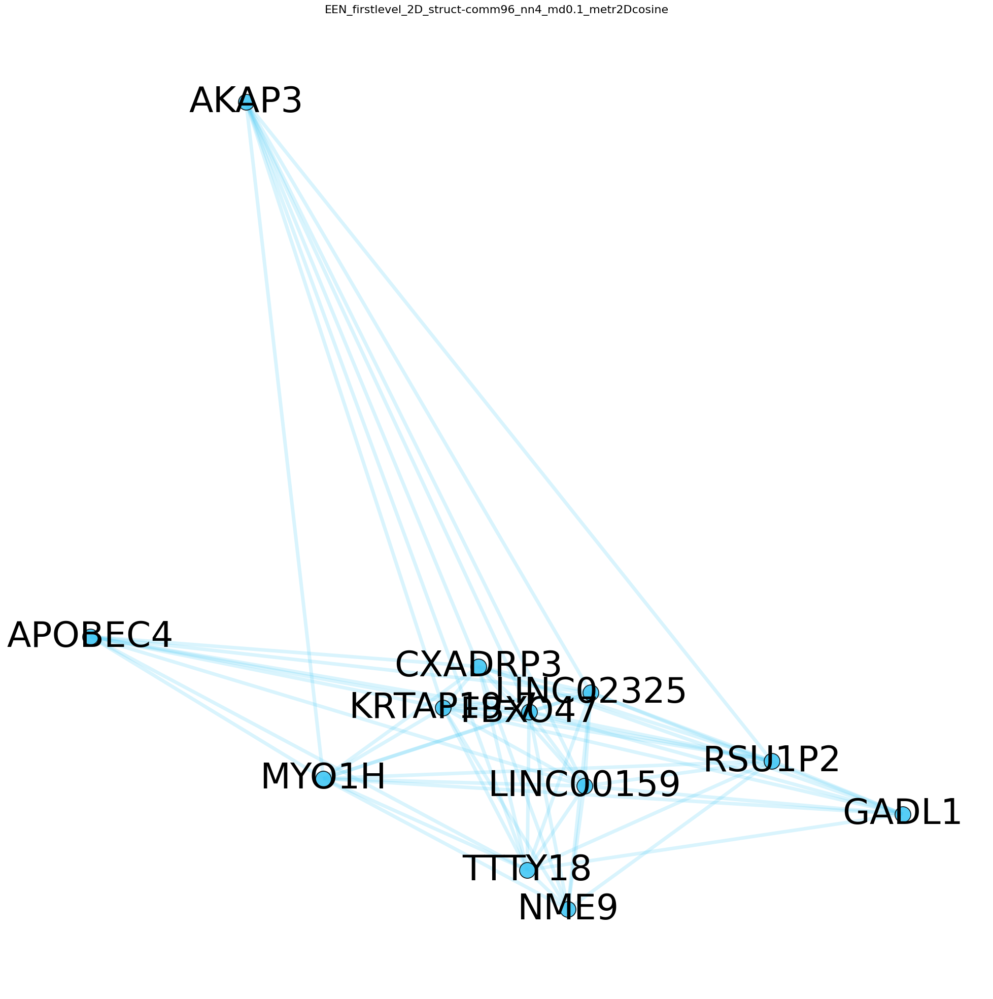

In [55]:
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            pos2D_allcommunities_firstlevel[i], 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],pos2D_allcommunities_firstlevel[i], width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)
    nx.draw_networkx_labels(subgraphs_allcommunities_firstlevel[i], pos2D_allcommunities_firstlevel[i],  font_color = 'black',font_size=50)
plt.box(False)
plt.savefig('output/Figures/SF19A_part4_named_post_rev.pdf',dpi=300)
plt.savefig('output/Figures/SF19A_part4_named_post_rev.png',dpi=300)

plt.show()

In [35]:

first_renamed_first_conversion_dict_rev['1_82']

79

Number of exposures in community: 16
Specific Graph: Graph with 16 nodes and 104 edges


/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of Nodes: (to match G_sub_first nodes):  16
communities of second level in third level community selected:  {79}
number of unique colors: 1
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1
Number of individual colors:  1


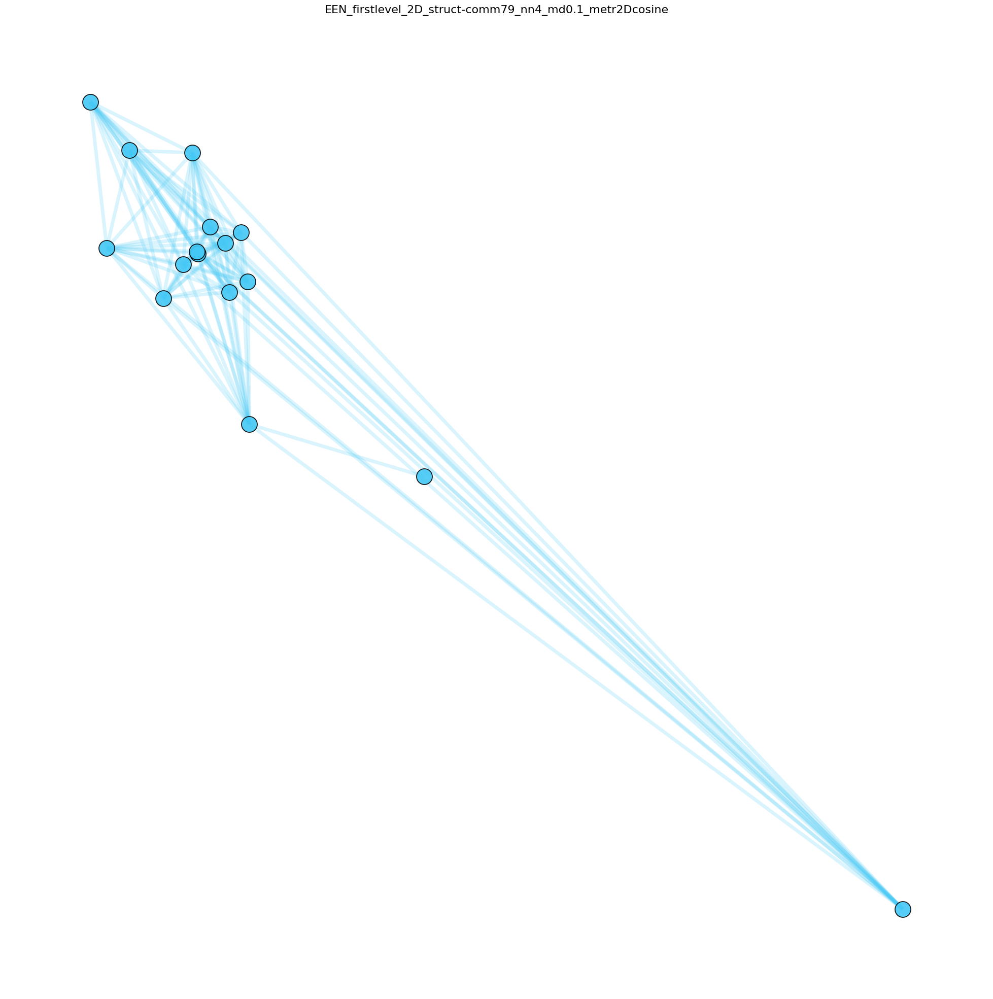

In [31]:
layoutname = 'firstlevel'

##########################################################
spec_comm_first = 79 #Salvo's selection 1_82
##########################################################

sublist_first = []
for k,v in d_comm_first.items():
    if v == spec_comm_first:
        sublist_first.append(k)

d_selectedcommunity_firstlevel = {spec_comm_first:sublist_first}
print("Number of exposures in community:" , len(*d_selectedcommunity_firstlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_first.values()),max(d_comm_first.values())):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community-1:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_first = subgraphs_subcommunities[spec_comm_first]
print("Specific Graph:" , G_sub_first)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_first) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_first, nodelist=list(G_sub_first.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_first.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_first.nodes())
FM_structural_sub.columns=list(G_sub_first.nodes())

n_n = 4
spr = 1.0
md = 0.1
metr2D = 'cosine'
posG2D_first = layout_portrait_umap(G_sub_first,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_first nodes): ', len(posG2D_first))

########################################
# COLORS 
########################################

d_comm_first_selected = {}
for node in G_sub_first.nodes():
    d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get unique color for each community 
colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(set_communities))
colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign previously assigned color (to remain same)
d_comm_col_new = {spec_comm_first:d_comm_col[1]} # dict(zip(set_communities , colorlist_fin))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_third.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for n_l in nodes_allcommunities_firstlevel:
    posG2D_comm = {}
    for n in n_l:
    # get positions from community nodes
        posG2D_comm[n] = posG2D_third[n]
    pos2D_allcommunities_firstlevel.append(posG2D_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col_new.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))


#######################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            pos2D_allcommunities_firstlevel[i], 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],pos2D_allcommunities_firstlevel[i], width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)

#plt.savefig('output/Figures/SF19A_part5_post_rev.pdf',dpi=300)
plt.show()

In [32]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_first.items():

    community_id = d_comm_first_selected.get(node)
    node_color = d_comm_col_new.get(community_id, "#000000")

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 500,      # same as plot
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None,
        "edge_alpha": None
    })


# ----------------------------
# EDGES (ALL EDGES in G_sub_first)
# ----------------------------
for u, v in G_sub_first.edges():

    comm_u = d_comm_first_selected.get(u, -1)
    comm_v = d_comm_first_selected.get(v, -1)

    # since this is a single first-level community,
    # all edges are within-community
    if comm_u == comm_v:
        edge_color = d_comm_col_new.get(comm_u, "#000000")
        edge_width = 5.0        # 2.0 * 2.5 from plot
        edge_alpha = 0.2
    else:
        edge_color = "#A1A1A1"
        edge_width = 0.1
        edge_alpha = 0.25

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width,
        "edge_alpha": edge_alpha
    })


# ----------------------------
# CREATE DATAFRAME
# ----------------------------
df_subnetwork_first = pd.DataFrame(rows)

print("Nodes:", len(df_subnetwork_first[df_subnetwork_first['row_type']=="node"]))
print("Edges:", len(df_subnetwork_first[df_subnetwork_first['row_type']=="edge"]))


# ----------------------------
# SAVE TO EXCEL
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(out_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_subnetwork_first.to_excel(
        writer,
        sheet_name="SF25A_part5",
        index=False
    )

print("First-level subnetwork saved successfully.")

Nodes: 16
Edges: 104
First-level subnetwork saved successfully.


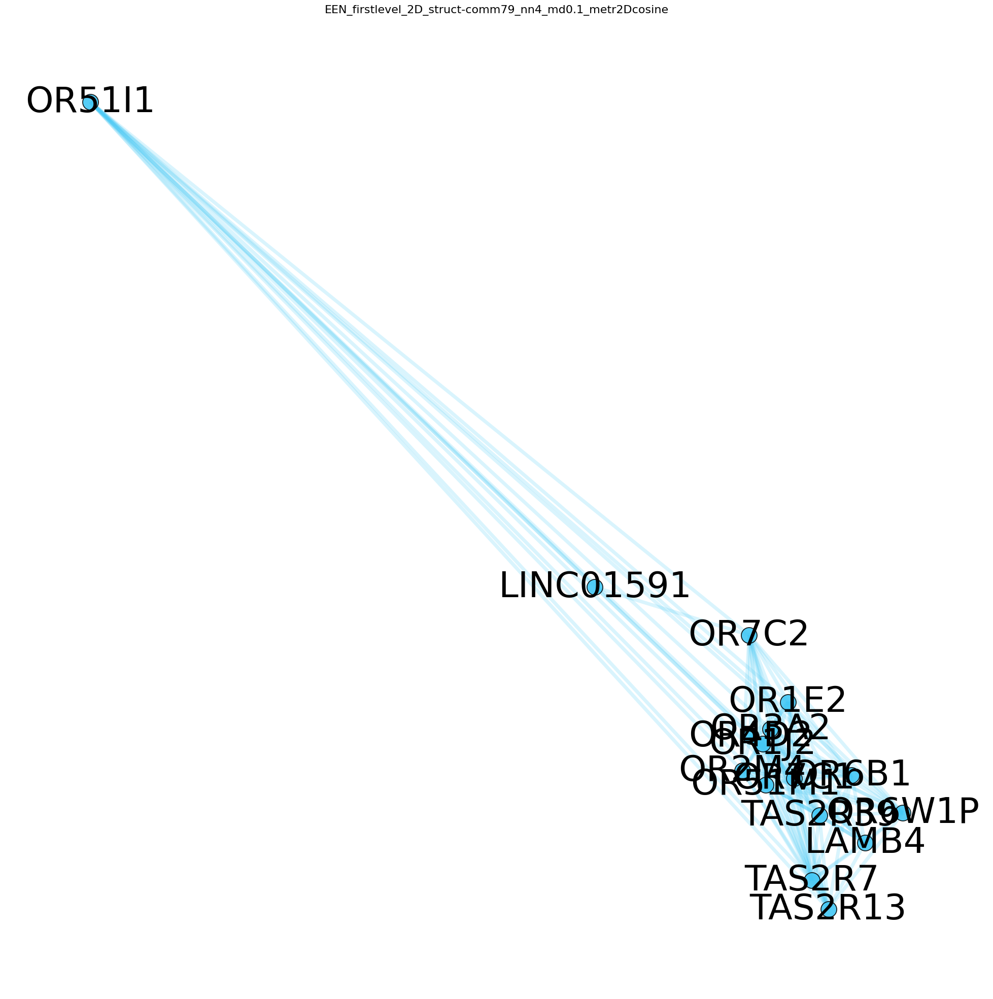

In [57]:
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            pos2D_allcommunities_firstlevel[i], 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],pos2D_allcommunities_firstlevel[i], width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)
    nx.draw_networkx_labels(subgraphs_allcommunities_firstlevel[i], pos2D_allcommunities_firstlevel[i],  font_color = 'black',font_size=50)
plt.box(False)

plt.savefig('output/Figures/SF19A_part5_named_post_rev.pdf',dpi=300)
plt.savefig('output/Figures/SF19A_part5_named_post_rev.png',dpi=300)
plt.show()